#Install Required Libraries

In [1]:
!pip install pyspark pandas matplotlib seaborn


In [18]:
!pip install datashader


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 69.7 MB/s eta 0:00:00


#Initialize a Spark Session



In [2]:
from pyspark.sql import SparkSession

# Initialize Spark session
spark = SparkSession.builder \
    .appName("InsurancePrediction") \
    .getOrCreate()


#Load the Dataset

In [130]:
df = spark.read.csv("/content/Insurance_prediction.csv", header=True, inferSchema=True)

# Show basic structure
df.printSchema()
df.show(5)


root
 |-- id: integer (nullable = true)
 |-- Gender: string (nullable = true)
 |-- Age: integer (nullable = true)
 |-- Driving_License: integer (nullable = true)
 |-- Region_Code: double (nullable = true)
 |-- Previously_Insured: integer (nullable = true)
 |-- Vehicle_Age: string (nullable = true)
 |-- Vehicle_Damage: string (nullable = true)
 |-- Annual_Premium: double (nullable = true)
 |-- Policy_Sales_Channel: double (nullable = true)
 |-- Vintage: integer (nullable = true)
 |-- Response: integer (nullable = true)

+---+------+---+---------------+-----------+------------------+-----------+--------------+--------------+--------------------+-------+--------+
| id|Gender|Age|Driving_License|Region_Code|Previously_Insured|Vehicle_Age|Vehicle_Damage|Annual_Premium|Policy_Sales_Channel|Vintage|Response|
+---+------+---+---------------+-----------+------------------+-----------+--------------+--------------+--------------------+-------+--------+
|  1|  Male| 44|              1|       28.0

In [131]:
# Show column names
df.columns


['id',
 'Gender',
 'Age',
 'Driving_License',
 'Region_Code',
 'Previously_Insured',
 'Vehicle_Age',
 'Vehicle_Damage',
 'Annual_Premium',
 'Policy_Sales_Channel',
 'Vintage',
 'Response']

In [132]:
# Summary statistics for all numerical columns
df.describe().show()



+-------+------------------+------+------------------+-------------------+------------------+-------------------+-----------+--------------+------------------+--------------------+------------------+-------------------+
|summary|                id|Gender|               Age|    Driving_License|       Region_Code| Previously_Insured|Vehicle_Age|Vehicle_Damage|    Annual_Premium|Policy_Sales_Channel|           Vintage|           Response|
+-------+------------------+------+------------------+-------------------+------------------+-------------------+-----------+--------------+------------------+--------------------+------------------+-------------------+
|  count|            381109|381109|            381109|             381109|            381109|             381109|     381109|        381109|            381109|              381109|            381109|             381109|
|   mean|          190555.0|  NULL|38.822583565331705| 0.9978693759528114|26.388807401557035| 0.4582101183650871|       

In [133]:
# Count the number of rows in the DataFrame
df.count()


381109

In [135]:
# Distribution of categorical features
df.groupBy("Gender").count().orderBy("count", ascending=False).show()
df.groupBy("Region_Code").count().orderBy("count", ascending=False).show()
df.groupBy("Vehicle_Age").count().orderBy("count", ascending=False).show()


+------+------+
|Gender| count|
+------+------+
|  Male|206089|
|Female|175020|
+------+------+

+-----------+------+
|Region_Code| count|
+-----------+------+
|       28.0|106415|
|        8.0| 33877|
|       46.0| 19749|
|       41.0| 18263|
|       15.0| 13308|
|       30.0| 12191|
|       29.0| 11065|
|       50.0| 10243|
|        3.0|  9251|
|       11.0|  9232|
|       36.0|  8797|
|       33.0|  7654|
|       47.0|  7436|
|       35.0|  6942|
|        6.0|  6280|
|       45.0|  5605|
|       37.0|  5501|
|       18.0|  5153|
|       48.0|  4681|
|       14.0|  4678|
+-----------+------+
only showing top 20 rows

+-----------+------+
|Vehicle_Age| count|
+-----------+------+
|   1-2 Year|200316|
|   < 1 Year|164786|
|  > 2 Years| 16007|
+-----------+------+



In [136]:
# Distribution of the Response variable
df.groupBy("Response").count().orderBy("count", ascending=False).show()


+--------+------+
|Response| count|
+--------+------+
|       0|334399|
|       1| 46710|
+--------+------+



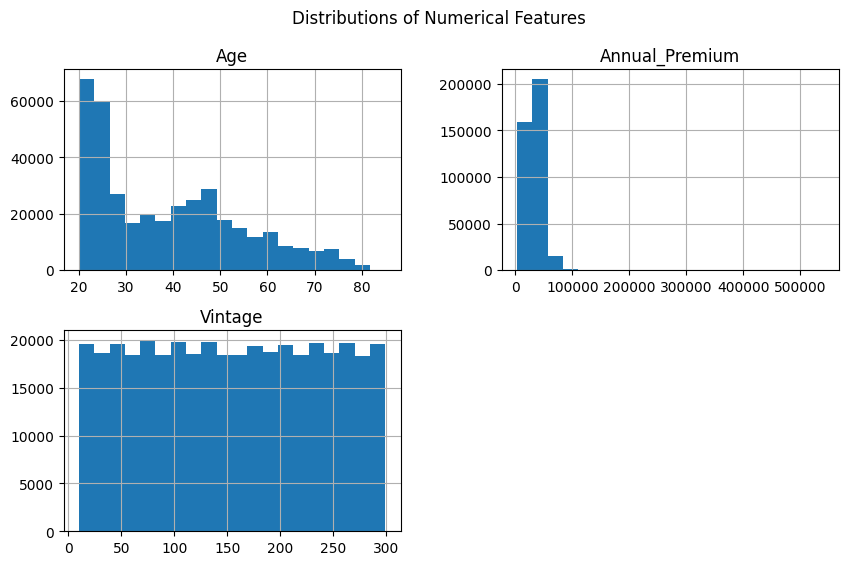

In [138]:
# Convert to Pandas for visualization
pandas_df = df.select("Age", "Annual_Premium", "Vintage").toPandas()

# Plot distributions
pandas_df.hist(bins=20, figsize=(10, 6))
plt.suptitle("Distributions of Numerical Features")
plt.show()


#Data Cleaning and Transformation

In [115]:
# Count missing values for each column
from pyspark.sql.functions import col, sum

df.select([(sum(col(c).isNull().cast("int")).alias(c)) for c in df.columns]).show()


+---+------+---+---------------+-----------+------------------+-----------+--------------+--------------+--------------------+-------+--------+
| id|Gender|Age|Driving_License|Region_Code|Previously_Insured|Vehicle_Age|Vehicle_Damage|Annual_Premium|Policy_Sales_Channel|Vintage|Response|
+---+------+---+---------------+-----------+------------------+-----------+--------------+--------------+--------------------+-------+--------+
|  0|     0|  0|              0|          0|                 0|          0|             0|             0|                   0|      0|       0|
+---+------+---+---------------+-----------+------------------+-----------+--------------+--------------+--------------------+-------+--------+



*The dataset has no missing values, indicating data completeness. Proceeding to encode categorical variables and prepare the data for modeling*


In [116]:
#Encode Categorical Variables:
#Gender, Vehicle_Age, Vehicle_Damage need to be encoded.

from pyspark.ml.feature import StringIndexer

# Encode categorical variables
indexer_gender = StringIndexer(inputCol="Gender", outputCol="Gender_Indexed")
indexer_vehicle_age = StringIndexer(inputCol="Vehicle_Age", outputCol="Vehicle_Age_Indexed")
indexer_vehicle_damage = StringIndexer(inputCol="Vehicle_Damage", outputCol="Vehicle_Damage_Indexed")

# Apply transformations
df = indexer_gender.fit(df).transform(df)
df = indexer_vehicle_age.fit(df).transform(df)
df = indexer_vehicle_damage.fit(df).transform(df)

df.select("Gender", "Gender_Indexed", "Vehicle_Age", "Vehicle_Age_Indexed").show(5)


+------+--------------+-----------+-------------------+
|Gender|Gender_Indexed|Vehicle_Age|Vehicle_Age_Indexed|
+------+--------------+-----------+-------------------+
|  Male|           0.0|  > 2 Years|                2.0|
|  Male|           0.0|   1-2 Year|                0.0|
|  Male|           0.0|  > 2 Years|                2.0|
|  Male|           0.0|   < 1 Year|                1.0|
|Female|           1.0|   < 1 Year|                1.0|
+------+--------------+-----------+-------------------+
only showing top 5 rows



In [117]:
#Drop Unnecessary Columns:

#Dropping redundant columns (`id`, `Gender`, `Vehicle_Age`, `Vehicle_Damage`) as they are either identifiers or have already been encoded.


df = df.drop("id", "Gender", "Vehicle_Age", "Vehicle_Damage")


# Data Visualisation

Distribution of Annual_Premium (Histogram using PySpark and Matplotlib)

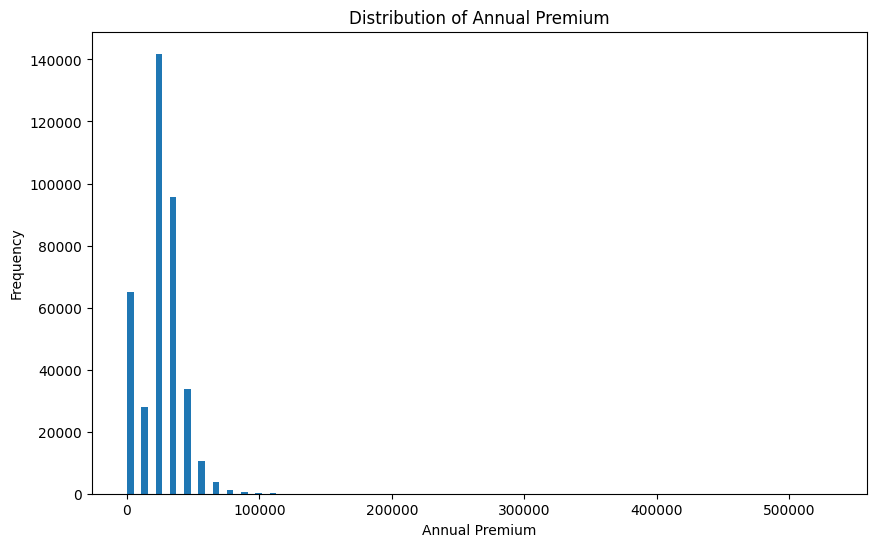

In [70]:
# Aggregating the data for histogram
premium_distribution = df.select("Annual_Premium").rdd.flatMap(lambda x: x).histogram(50)

# Plotting using Matplotlib
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(premium_distribution[0][:-1], premium_distribution[1], width=5000)
plt.title("Distribution of Annual Premium")
plt.xlabel("Annual Premium")
plt.ylabel("Frequency")
plt.show()



Age vs. Annual Premium with Response (Scatter Plot using Spark DataFrame and Bokeh)

In [14]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource, CategoricalColorMapper

# Enable notebook display for Bokeh plots
output_notebook()

# Convert Spark DataFrame to Pandas for plotting
scatter_data = df.select("Age", "Annual_Premium", "Response").toPandas()

# Ensure Response is treated as a string for proper color mapping
scatter_data["Response"] = scatter_data["Response"].astype(str)

# Create a ColumnDataSource
source = ColumnDataSource(scatter_data)

# Define a color mapper based on the Response variable
color_mapper = CategoricalColorMapper(factors=['0', '1'], palette=['red', 'green'])

# Create the Bokeh figure
p = figure(
    title="Age vs Annual Premium by Response",
    x_axis_label="Age",
    y_axis_label="Annual Premium",
    width=800,
    height=400
)

# Add scatter points with color mapping
p.scatter(
    x="Age",
    y="Annual_Premium",
    source=source,
    size=5,
    color={'field': 'Response', 'transform': color_mapper},
    legend_field="Response",
    alpha=0.5
)

# Customize the legend
p.legend.title = "Response"
p.legend.location = "top_right"

# Show the plot
show(p)




Proportion of Customers Interested vs. Not Interested (Bar Chart using PySpark and Matplotlib)

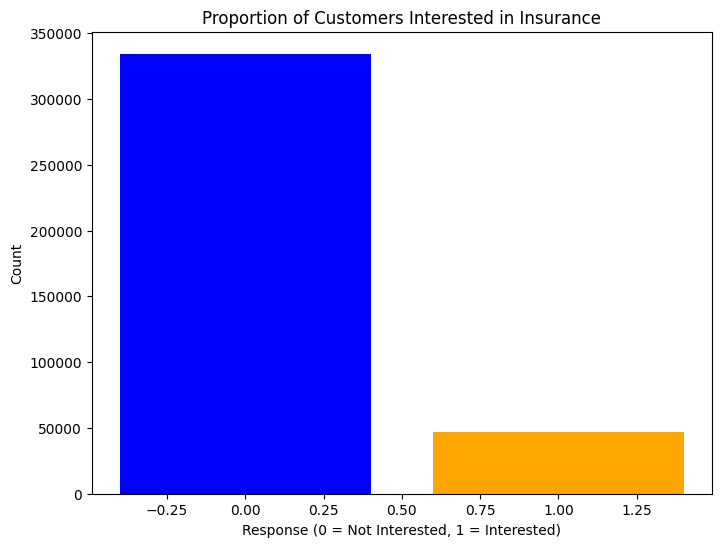

In [16]:
# Aggregating Response counts
response_counts = df.groupBy("Response").count().toPandas()

# Plotting the bar chart
plt.figure(figsize=(8, 6))
plt.bar(response_counts["Response"], response_counts["count"], color=['orange', 'blue'])
plt.title("Proportion of Customers Interested in Insurance")
plt.xlabel("Response (0 = Not Interested, 1 = Interested)")
plt.ylabel("Count")
plt.show()



 Correlation Matrix (Heatmap using Plotly)

In [21]:
import pandas as pd
import plotly.figure_factory as ff

# Compute correlation matrix
numeric_columns = [col for col, dtype in df.dtypes if dtype in ['int', 'double']]
correlation_matrix = pd.DataFrame(
    {col: [df.stat.corr(col, other) for other in numeric_columns] for col in numeric_columns},
    index=numeric_columns
)

# Format the values to 2 decimal places
correlation_matrix = correlation_matrix.round(2)

# Create heatmap with annotations
fig = ff.create_annotated_heatmap(
    z=correlation_matrix.values,
    x=list(correlation_matrix.columns),
    y=list(correlation_matrix.columns),
    annotation_text=correlation_matrix.values.astype(str),  # Show formatted values
    colorscale="Viridis",
    showscale=True
)

fig.update_layout(title="Correlation Matrix Heatmap")
fig.show()



The Correlation Matrix Heatmap provides an overview of the relationships between numerical features in the dataset.
*Key Observations:*
1. Strong positive correlation (0.82) between `Previously_Insured` and `Vehicle_Damage_Indexed` suggests that customers with vehicle damage are more likely to have existing insurance.
2. `Policy_Sales_Channel` shows a moderate negative correlation (-0.58) with `Vehicle_Age_Indexed`, indicating that older vehicles might be associated with specific sales channels.
3. Weak correlation between `Response` and other features suggests no single strong predictor for customer interest.
4. `Age` has no significant correlation with `Response` but shows a weak positive correlation (0.07) with `Annual_Premium`.
Insights from this heatmap can guide feature selection and highlight multicollinearity concerns for modeling.


Boxplot of Annual Premium by Response

<ipython-input-22-8f0921972799>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




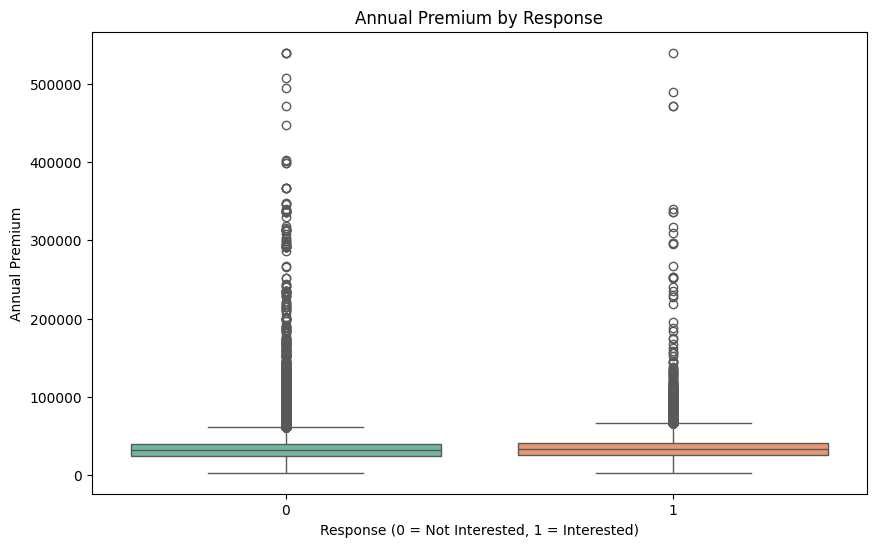

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert Spark DataFrame to Pandas
boxplot_data = df.select("Annual_Premium", "Response").toPandas()

# Create a boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x="Response", y="Annual_Premium", data=boxplot_data, palette="Set2")
plt.title("Annual Premium by Response")
plt.xlabel("Response (0 = Not Interested, 1 = Interested)")
plt.ylabel("Annual Premium")
plt.show()


*Key observations:*
1. Both groups have a similar median premium, suggesting no major difference in premium levels.
2. There are several outliers with high premiums in both groups, indicating the need for further investigation.
3. The range of premiums for uninterested customers is slightly broader.
This visualization helps understand if premium amounts influence customer interest.

#Data Modeling

In [89]:
# # Split the original DataFrame into train and test
# train_df, test_df = df.randomSplit([0.8, 0.2], seed=42)

# Verify that the required feature columns are present
print("Columns in train_df:", train_df.columns)


Columns in train_df: ['Age', 'Driving_License', 'Region_Code', 'Previously_Insured', 'Annual_Premium', 'Policy_Sales_Channel', 'Vintage', 'Response', 'Gender_Indexed', 'Vehicle_Age_Indexed', 'Vehicle_Damage_Indexed', 'classWeightCol']


In [118]:
train_df.show(10)

+---+---------------+-----------+------------------+--------------+--------------------+-------+--------+--------------+-------------------+----------------------+
|Age|Driving_License|Region_Code|Previously_Insured|Annual_Premium|Policy_Sales_Channel|Vintage|Response|Gender_Indexed|Vehicle_Age_Indexed|Vehicle_Damage_Indexed|
+---+---------------+-----------+------------------+--------------+--------------------+-------+--------+--------------+-------------------+----------------------+
| 20|              1|        1.0|                 0|        2630.0|               156.0|    167|       0|           1.0|                0.0|                   0.0|
| 20|              1|        1.0|                 0|        2630.0|               156.0|    171|       0|           0.0|                0.0|                   0.0|
| 20|              1|        1.0|                 0|        2630.0|               160.0|    100|       0|           1.0|                1.0|                   1.0|
| 20|           

Training with different models

In [122]:
from pyspark.ml.feature import VectorAssembler, StandardScaler, StringIndexer
from pyspark.ml import Pipeline
from pyspark.ml.classification import LogisticRegression, DecisionTreeClassifier, GBTClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator, BinaryClassificationEvaluator
from pyspark.sql.functions import when
from pyspark.sql import Row
from imblearn.over_sampling import SMOTE
import pandas as pd
from pyspark.ml.linalg import Vectors

# Split Data
train_df, test_df = df.randomSplit([0.8, 0.2], seed=42)

# Define Features
continuous_features = ["Age", "Annual_Premium", "Vintage"]
categorical_features = ["Driving_License", "Region_Code", "Previously_Insured",
                        "Gender_Indexed", "Vehicle_Age_Indexed", "Vehicle_Damage_Indexed",
                        "Policy_Sales_Channel"]

# Assemble features for SMOTE
assembler = VectorAssembler(inputCols=continuous_features + categorical_features, outputCol="features")
train_df_with_features = assembler.transform(train_df)

# Convert to Pandas for SMOTE
train_pandas = train_df_with_features.select("features", "Response").toPandas()

# Split into features (X) and labels (y)
X = [row.toArray() for row in train_pandas["features"]]  # Convert Vectors to arrays
y = train_pandas["Response"]

# Apply SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Convert back to PySpark
resampled_data = pd.DataFrame({"features": X_resampled, "Response": y_resampled})
resampled_data["features"] = resampled_data["features"].apply(lambda x: Vectors.dense(x))  # Convert arrays to dense vectors
balanced_train_df = spark.createDataFrame(
    [Row(features=row["features"], Response=row["Response"]) for _, row in resampled_data.iterrows()]
)

# Check class distribution after SMOTE
print("Class distribution after SMOTE:")
balanced_train_df.groupBy("Response").count().show()

# Assemble features for the test data
test_df_with_features = assembler.transform(test_df)

# Scale Features
scaler = StandardScaler(inputCol="features", outputCol="scaled_features")
scaler_model = scaler.fit(balanced_train_df)  # Fit on training data
scaled_train_df = scaler_model.transform(balanced_train_df)  # Transform training data
scaled_test_df = scaler_model.transform(test_df_with_features)  # Transform test data

# Index the Target Variable
label_indexer = StringIndexer(inputCol="Response", outputCol="label")

# Define Models
logistic_regression = LogisticRegression(featuresCol="scaled_features", labelCol="label", maxIter=10)
decision_tree = DecisionTreeClassifier(featuresCol="scaled_features", labelCol="label", maxDepth=10)
xgboost = GBTClassifier(featuresCol="scaled_features", labelCol="label", maxIter=10)

# Create pipelines for each model
lr_pipeline = Pipeline(stages=[label_indexer, logistic_regression])
dt_pipeline = Pipeline(stages=[label_indexer, decision_tree])
xgb_pipeline = Pipeline(stages=[label_indexer, xgboost])

# Train models
lr_model = lr_pipeline.fit(scaled_train_df)
dt_model = dt_pipeline.fit(scaled_train_df)
xgb_model = xgb_pipeline.fit(scaled_train_df)

# Make predictions
lr_predictions = lr_model.transform(scaled_test_df)
dt_predictions = dt_model.transform(scaled_test_df)
xgb_predictions = xgb_model.transform(scaled_test_df)

# Evaluate Models
evaluator_auc = BinaryClassificationEvaluator(labelCol="label", metricName="areaUnderROC")
evaluator_acc = MulticlassClassificationEvaluator(labelCol="label", metricName="accuracy")
evaluator_precision = MulticlassClassificationEvaluator(labelCol="label", metricName="weightedPrecision")
evaluator_recall = MulticlassClassificationEvaluator(labelCol="label", metricName="weightedRecall")
evaluator_f1 = MulticlassClassificationEvaluator(labelCol="label", metricName="f1")

# Function to evaluate models
def evaluate_model(predictions, model_name):
    print(f"Model: {model_name}")
    print(f"Accuracy: {evaluator_acc.evaluate(predictions):.4f}")
    print(f"Precision: {evaluator_precision.evaluate(predictions):.4f}")
    print(f"Recall: {evaluator_recall.evaluate(predictions):.4f}")
    print(f"F1-Score: {evaluator_f1.evaluate(predictions):.4f}")
    print(f"AUC: {evaluator_auc.evaluate(predictions):.4f}")
    print("-" * 50)

# Evaluate all models
print("Logistic Regression Evaluation:")
evaluate_model(lr_predictions, "Logistic Regression")

print("Decision Tree Evaluation:")
evaluate_model(dt_predictions, "Decision Tree")

print("XGBoost Evaluation:")
evaluate_model(xgb_predictions, "XGBoost")




Class distribution after SMOTE:
+--------+------+
|Response| count|
+--------+------+
|       0|267417|
|       1|267417|
+--------+------+

Logistic Regression Evaluation:
Model: Logistic Regression
Accuracy: 0.6385
Precision: 0.9032
Recall: 0.6385
F1-Score: 0.6995
AUC: 0.8167
--------------------------------------------------
Decision Tree Evaluation:
Model: Decision Tree
Accuracy: 0.7896
Precision: 0.8570
Recall: 0.7896
F1-Score: 0.8149
AUC: 0.8222
--------------------------------------------------
XGBoost Evaluation:
Model: XGBoost
Accuracy: 0.7535
Precision: 0.8787
Recall: 0.7535
F1-Score: 0.7924
AUC: 0.8363
--------------------------------------------------


#Model Summary

In [124]:
# Summary of model performance
print("Model Performance Summary:")

# Capturing the actual metrics after SMOTE in a dictionary
model_metrics = {
    "Model": ["Logistic Regression", "Decision Tree", "XGBoost"],
    "Accuracy": [0.6385, 0.7896, 0.7535],
    "Precision": [0.9032, 0.8570, 0.8787],
    "Recall": [0.6385, 0.7896, 0.7535],
    "F1-Score": [0.6995, 0.8149, 0.7924],
    "AUC": [0.8167, 0.8222, 0.8363],
}

import pandas as pd

# Creating a DataFrame for the metrics
metrics_df = pd.DataFrame(model_metrics)

# Displaying the performance metrics table
print(metrics_df)



Model Performance Summary:
                 Model  Accuracy  Precision  Recall  F1-Score     AUC
0  Logistic Regression    0.6385     0.9032  0.6385    0.6995  0.8167
1        Decision Tree    0.7896     0.8570  0.7896    0.8149  0.8222
2              XGBoost    0.7535     0.8787  0.7535    0.7924  0.8363


#Feature Importance

In [125]:
# Feature importance for Decision Tree
dt_feature_importance = dt_model.stages[-1].featureImportances

# Map feature importance to feature names
feature_names = continuous_features + categorical_features
feature_importance = list(zip(feature_names, dt_feature_importance.toArray()))

# Sort features by importance
sorted_features = sorted(feature_importance, key=lambda x: x[1], reverse=True)

print("Feature Importance (Decision Tree):")
for feature, importance in sorted_features:
    print(f"{feature}: {importance:.4f}")


Feature Importance (Decision Tree):
Vehicle_Damage_Indexed: 0.6197
Gender_Indexed: 0.1431
Age: 0.1005
Vehicle_Age_Indexed: 0.0841
Previously_Insured: 0.0259
Policy_Sales_Channel: 0.0164
Region_Code: 0.0093
Annual_Premium: 0.0006
Vintage: 0.0002
Driving_License: 0.0000


In [126]:
# Feature importance for XGBoost (GBTClassifier)
xgb_feature_importance = xgb_model.stages[-1].featureImportances

# Map feature importance to feature names
feature_importance_xgb = list(zip(feature_names, xgb_feature_importance.toArray()))
sorted_features_xgb = sorted(feature_importance_xgb, key=lambda x: x[1], reverse=True)

print("Feature Importance (XGBoost):")
for feature, importance in sorted_features_xgb:
    print(f"{feature}: {importance:.4f}")

Feature Importance (XGBoost):
Vehicle_Damage_Indexed: 0.3070
Vehicle_Age_Indexed: 0.2323
Gender_Indexed: 0.1342
Previously_Insured: 0.1222
Region_Code: 0.0874
Age: 0.0827
Policy_Sales_Channel: 0.0321
Annual_Premium: 0.0021
Vintage: 0.0000
Driving_License: 0.0000


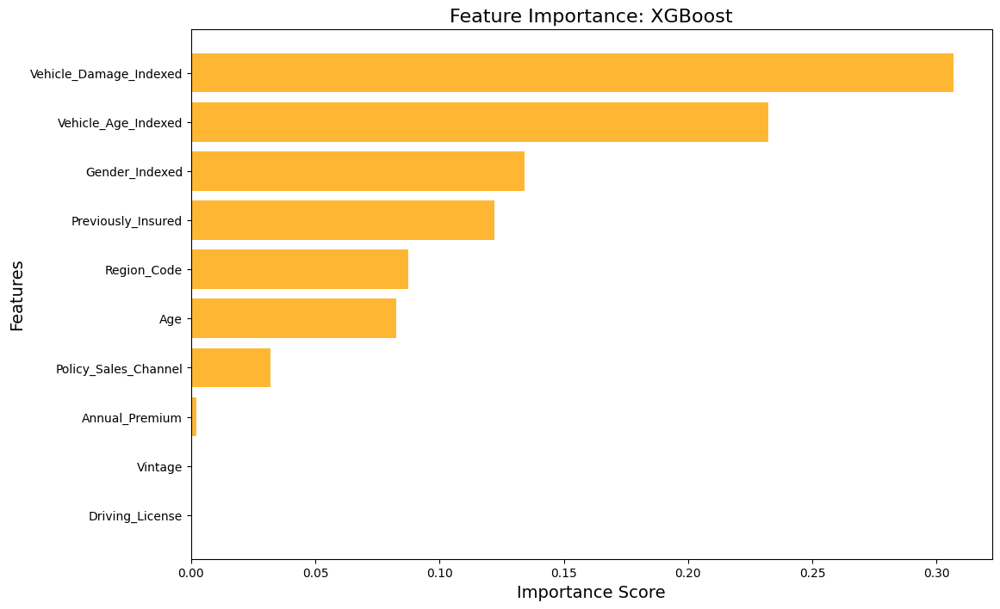

In [127]:
import matplotlib.pyplot as plt
import pandas as pd

# Feature names
feature_names = continuous_features + categorical_features

# Extract feature importance from XGBoost
xgb_feature_importance = xgb_model.stages[-1].featureImportances.toArray()

# Combine feature importance into a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "XGBoost Importance": xgb_feature_importance
})

# Sort features by XGBoost importance (descending order)
feature_importance_df = feature_importance_df.sort_values(by="XGBoost Importance", ascending=False)

# Plot feature importance for XGBoost
plt.figure(figsize=(12, 8))
plt.barh(
    feature_importance_df["Feature"],
    feature_importance_df["XGBoost Importance"],
    color="orange",
    alpha=0.8
)

plt.title("Feature Importance: XGBoost", fontsize=16)
plt.xlabel("Importance Score", fontsize=14)
plt.ylabel("Features", fontsize=14)
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()

#Cluster Analysis

In [78]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator

# Use the same features assembled in the earlier pipeline
assembler_all = VectorAssembler(
    inputCols=["scaled_continuous_features"] + categorical_features,
    outputCol="features"
)

# Apply VectorAssembler and StandardScaler to prepare data
assembler_continuous = VectorAssembler(inputCols=continuous_features, outputCol="continuous_features")
scaler = StandardScaler(inputCol="continuous_features", outputCol="scaled_continuous_features")

# Pipeline for feature preparation
prep_pipeline = Pipeline(stages=[assembler_continuous, scaler, assembler_all])
prep_model = prep_pipeline.fit(df)
prepared_df = prep_model.transform(df)

# K-Means Clustering
kmeans = KMeans(featuresCol="features", predictionCol="cluster", k=5, seed=42)  # k=5 clusters
kmeans_model = kmeans.fit(prepared_df)

# Make Predictions
clustered_df = kmeans_model.transform(prepared_df)

# Evaluate Clustering
evaluator = ClusteringEvaluator(predictionCol="cluster", featuresCol="features", metricName="silhouette")
silhouette = evaluator.evaluate(clustered_df)

print(f"Silhouette Score for K-Means Clustering: {silhouette:.4f}")

# Analyze Cluster Centers
centers = kmeans_model.clusterCenters()

print("Cluster Centers:")
for idx, center in enumerate(centers):
    print(f"Cluster {idx}: {center}")



Silhouette Score for K-Means Clustering: 0.8277
Cluster Centers:
Cluster 0: [  1.83459279   1.65827656   1.84297104   0.99985853  35.97437711
   0.60277449   0.53630351   0.81736839   0.6398649  153.55946844]
Cluster 1: [  3.08246507   1.95078867   1.83659529   0.99669515  32.71782337
   0.27952666   0.38062168   0.18852896   0.31603235 123.49888061]
Cluster 2: [ 3.2958253   1.93267434  1.84493215  0.99491166 27.14476961  0.31482526
  0.38877646  0.22800241  0.34549152 25.44027281]
Cluster 3: [  3.05539513   1.64350956   1.85074541   0.99775479   9.80484262
   0.31789566   0.33334801   0.13502091   0.35742901 123.61532027]
Cluster 4: [  1.76698347   1.62774661   1.85200952   0.99993494  10.76408968
   0.63137143   0.54444546   0.85199162   0.67595352 153.52011139]


#Visualization of Clusters:

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



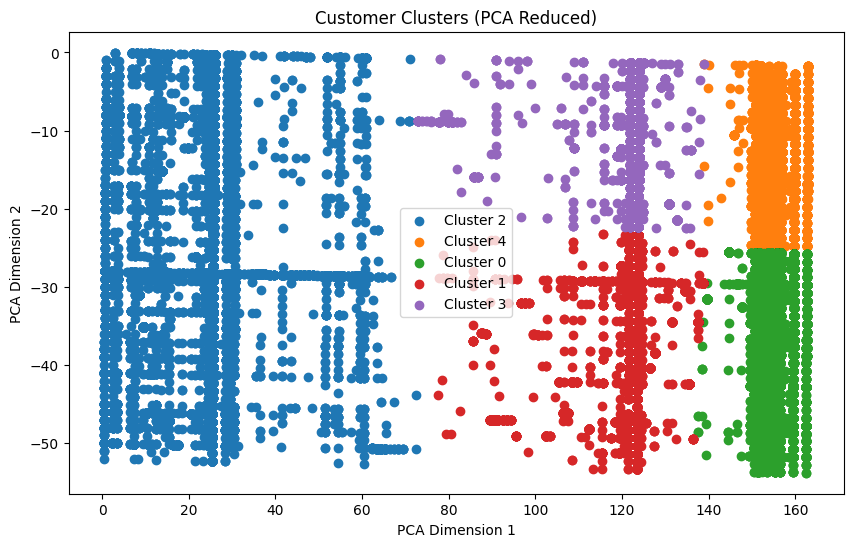

In [79]:
from pyspark.ml.feature import PCA
import matplotlib.pyplot as plt

# Apply PCA to reduce features to 2 dimensions for visualization
pca = PCA(k=2, inputCol="features", outputCol="pca_features")
pca_model = pca.fit(clustered_df)
pca_df = pca_model.transform(clustered_df)

# Convert to Pandas for visualization
pandas_df = pca_df.select("pca_features", "cluster").toPandas()

# Extract PCA coordinates
pandas_df["x"] = pandas_df["pca_features"].apply(lambda row: row[0])
pandas_df["y"] = pandas_df["pca_features"].apply(lambda row: row[1])

# Plot the clusters
plt.figure(figsize=(10, 6))
for cluster in pandas_df["cluster"].unique():
    cluster_data = pandas_df[pandas_df["cluster"] == cluster]
    plt.scatter(cluster_data["x"], cluster_data["y"], label=f"Cluster {cluster}")

plt.title("Customer Clusters (PCA Reduced)")
plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.legend()
plt.show()
